In [1]:
## Import all required libraries
import warnings
warnings.filterwarnings('ignore')
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # nicer statistical plots
import anndata as ad
import scimap as sm
from scipy.spatial import cKDTree  # fast neighbor-within-radius search, used by spatial_interaction_working
from scipy.cluster.hierarchy import linkage, dendrogram # clustering for heatmaps

from PIL import Image # Python Imaging Library, used to load a saved image back in
import matplotlib.patches as mpatches  # used to build colored legend squares manually for voronoi

print("✅ All libraries imported successfully.")

Running SCIMAP  2.3.5
✅ All libraries imported successfully.


In [2]:
from contextlib import contextmanager

@contextmanager
def titled_plot(title, fontsize=14, top=None):
    """Adds a title to whatever figure(s) a scimap sm.pl.* call creates internally."""
    original_show = plt.show
    def show_with_title(*args, **kwargs):
        for num in plt.get_fignums():
            fig = plt.figure(num)
            if fig.axes:
                x0 = min(a.get_position().x0 for a in fig.axes)
                x1 = max(a.get_position().x1 for a in fig.axes)
                x_center = (x0 + x1) / 2
            else:
                x_center = 0.5
            fig.suptitle(title, fontsize=fontsize, x=x_center)
            if top is not None:
                fig.subplots_adjust(top=top)
        original_show(*args, **kwargs)
    plt.show = show_with_title
    try:
        yield
    finally:
        plt.show = original_show

print("Helper 'titled_plot' defined")

Helper 'titled_plot' defined


In [3]:
## ‼️UPDATE‼️ this cell when doing a new sample or when you want to make a change 

working_dir = 'C:/Users/kelse/OneDrive - The Mount Sinai Hospital/02_Presentations/Platforma_MCMICRO_Tutorial_Docs/MCMICRO_Python_Analysis/analysis' # Please update root folder containing all the samples

SAMPLE_ID = "41_ST_KO" #update every new sample

# Path to h5ad from step 1 
h5ad_path = f'{working_dir}/scimap_results/adata_tocombine/adata_{SAMPLE_ID}.h5ad'

# Column names
phenotype_col = 'phenotype' # column holding cell type labels
roi_col = 'ROI'  # column holding ROI assignments

# Which ROIs to include -- this is computed automatically from the file's own ROI labels
# once it's loaded below (see the "Load the phenotyped adata" cell), so it doesn't need
# to be hand-edited per sample

# Colors -- these have to match your phenotype names exactly 
customColors = {
    'M1 Macs':          '#118ab2',
    'Dendritic cells':  '#ffd166',
    'Macrophages':      '#06d6a0',
    'Tumor cells':      '#ef476f',
    'CD8 T cells':      '#073b4c',
    'Myeloid cells':    '#ff9f1c',
    'CD4 T cells':      '#7209b7',
    'Epithilial cells': '#4cc9f0',
    'M2 Macs':          '#80ed99',
    'Lymphoid cells':   '#f15bb5',
    'T cells':          '#9b5de5',
    'Immune cells':     '#00bbf9',
    'PDL1 cells':       '#fee440',
    'neutrophils':      '#fb5607',
    'NK cells':         '#3a86ff',
    'PD1 cells':        '#8338ec',
}

# Confirm the configuration 
print(f"Data directory: {h5ad_path}")

Data directory: C:/Users/kelse/OneDrive - The Mount Sinai Hospital/02_Presentations/Platforma_MCMICRO_Tutorial_Docs/MCMICRO_Python_Analysis/analysis/scimap_results/adata_tocombine/adata_41_ST_KO.h5ad


In [4]:
# Several of the commands below require inputs in pixels
# Here is a formula to convert your desired radius in um to pixels

# um to pixel conversion formula:
radius_um = 30  # the radius you want in micrometers
pixel_size_um = 0.65  # your known pixel size -- this shouldn't change

radius_px = radius_um / pixel_size_um

print(f"Radius: {radius_um} um = {radius_px:.1f} pixels")

Radius: 30 um = 46.2 pixels


In [5]:
## Extra custom configuration -- ‼️UPDATE‼️ this cell as well when doing a new sample or when you want to make a change 

# Spatial interaction radius (pixels)
# 70px is approx 50–100 µm depending on image resolution
interaction_radius = 76.9 ## ‼️UPDATE‼️ based on formula above

# Which ROI(s) to compute spatial interactions for -- restricted to just these ROIs
# (rather than every ROI in rois_to_use) since Spleen's ~970k cells make its neighbor
# table too large to build in memory at all, and we only care about the tumor regions here anyway
spatial_interaction_rois = ['Tumor', 'Tumor2']

# Voronoi tissue map settings 
voronoi_rois = ['Tumor', 'Tumor2']    # which ROI(s) to plot -- one image per ROI in this list
voronoi_save_dir = f'{working_dir}/plots'
voronoi_size_max = 3000      # max polygon size in pixels^2, -- higher = more filled but more edge spikes
voronoi_max_cells = 15000    # ‼️UPDATE‼️ Voronoi has to compute + draw one polygon per cell, which gets slow
                              # past tens of thousands -- if the ROI has more cells than this, we randomly
                              # subsample (stratified by phenotype, see below) down to this many before plotting.
                              # Raise for more detail/slower, lower for faster/coarser. Set to None to disable.

# Foldchange settings
foldchange_from ='Spleen'   # the reference ROI, all other ROIs are compared TO this one
foldchange_to  = None  # None = compare against ALL other ROIs automatically, can also set to (ex.) 'ROI2' to compare just 1 pair
foldchange_label = 'foldchange_roi' # name to store the results under inside adata1

# Spatial distance settings
distance_rois = ['Tumor', 'Tumor2'] # which ROI(s) to compute/plot spatial distances for -- excludes Spleen,
                                     # since a handful of cells there are phenotyped as Tumor cells (mis-drawn
                                     # ROI boundary or phenotyping error), which would otherwise skew distances
distance_from = 'Tumor cells' # the cell type to measure FROM 
distance_to  = [
    'neutrophils',
    'PDL1 cells',
    'PD1 cells',
    'M2 Macs',
    'M1 Macs',
    'Epithilial cells',
    'Dendritic cells',
    'CD8 T cells',
    'CD4 T cells',
]
# the cell types to measure TO
                       

# Spatial aggregate settings
aggregate_rois = ['Tumor', 'Tumor2'] # which ROI(s) to run spatial_aggregate + plot the aggregate voronoi for
aggregate_radius = 46.2  # search radius in pixels -- how far to look for neighbors ## ‼️UPDATE‼️based on formula above
aggregate_purity = 80  # minimum % of neighbors that must be the same cell type to call a region "pure" 
aggregate_label = 'spatial_aggregate'  # name for the new column added to adata1.obs


# Confirm the configuration 
print(f"Save directory: {voronoi_save_dir}")

Save directory: C:/Users/kelse/OneDrive - The Mount Sinai Hospital/02_Presentations/Platforma_MCMICRO_Tutorial_Docs/MCMICRO_Python_Analysis/analysis/plots


In [6]:
# Load the phenotyped adata saved at the end of step 1
adata = ad.read_h5ad(h5ad_path)
print(adata)
print('\nCell type counts:')
print(adata.obs[phenotype_col].value_counts()) # how many cells of each type

# Which ROIs to include -- pull directly from whatever ROI labels are actually present
# in this file instead of a hardcoded list, so this stays correct no matter what the
# ROIs happen to be named in a given sample (step 1 already drops any cells that
# aren't assigned to a real ROI, so every label found here is one we want to keep)
rois_to_use = sorted(adata.obs[roi_col].dropna().unique().tolist())
print(f'\nROIs found in this file: {rois_to_use}')

AnnData object with n_obs × n_vars = 692343 × 24
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'Treatment_Group', 'phenotype', 'Tumor', 'Tumor2', 'Spleen', 'ROI', 'genotype'
    uns: 'all_markers', 'gates'
    layers: 'log'

Cell type counts:
phenotype
M1 Macs             443098
Dendritic cells      81621
Macrophages          31642
Tumor cells          30481
Myeloid cells        19061
Epithilial cells     17795
CD8 T cells          15439
M2 Macs              14232
T cells              11556
CD4 T cells          11485
Lymphoid cells        9904
Immune cells          3237
PDL1 cells            1830
neutrophils            680
NK cells               242
PD1 cells               40
Name: count, dtype: int64

ROIs found in this file: ['Spleen', 'Tumor', 'Tumor2']


In [7]:
# All cells in this file are already inside an ROI (step 1 dropped "other")
# But this line is just a safety filter + makes a clean copy to work with
adata1 = adata[adata.obs[roi_col].isin(rois_to_use)].copy() # grab ROI column, turn into true/false list (boolean mask), keep only true rows

print(f'Total cells in ROIs: {adata1.n_obs:,}')
print('\nCells per ROI:')
print(adata1.obs[roi_col].value_counts()) # how many cells of each ROI

Total cells in ROIs: 692,343

Cells per ROI:
ROI
Spleen    397607
Tumor     208812
Tumor2     85924
Name: count, dtype: int64


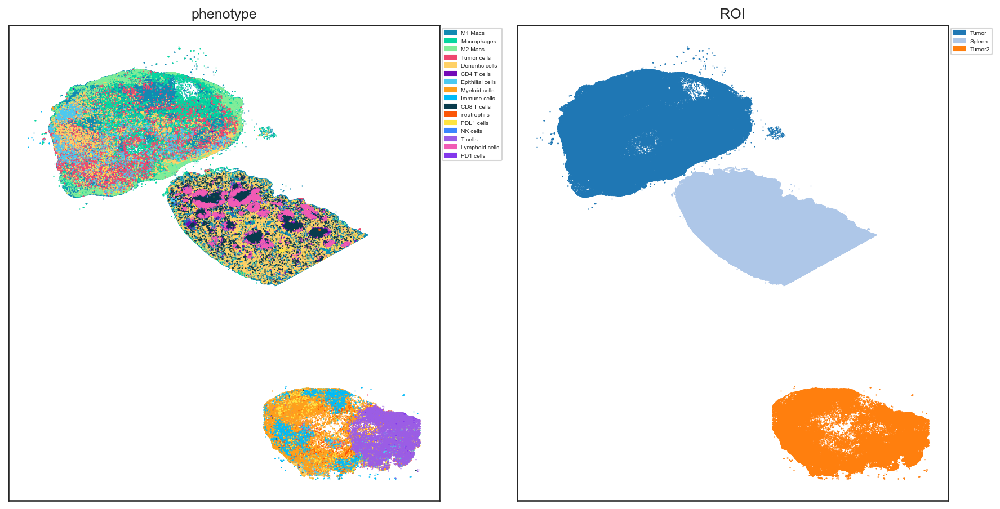

phenotype
M1 Macs             443098
Dendritic cells      81621
Macrophages          31642
Tumor cells          30481
Myeloid cells        19061
Epithilial cells     17795
CD8 T cells          15439
M2 Macs              14232
T cells              11556
CD4 T cells          11485
Lymphoid cells        9904
Immune cells          3237
PDL1 cells            1830
neutrophils            680
NK cells               242
PD1 cells               40
Name: count, dtype: int64
ROI
Spleen    397607
Tumor     208812
Tumor2     85924
Name: count, dtype: int64


In [8]:
## Whole tissue scatter plot -- view of the entire tissue colored by cell type + ROI side by side
sm.pl.spatial_scatterPlot( # scimap func, plots cells at their X/Y positions
    adata=adata1,
    colorBy=[phenotype_col, roi_col],# make 2 plots side by side: one colored by cell type, one by ROI
    figsize=(12, 12),
    s=1, # dot size -- small here
    plotLegend=True, # show color legend
    fontsize=5,
    dpi=150,
    customColors=customColors # use our defined color names
)

print(adata.obs[phenotype_col].value_counts())
print(adata.obs[roi_col].value_counts())

--Spleen--


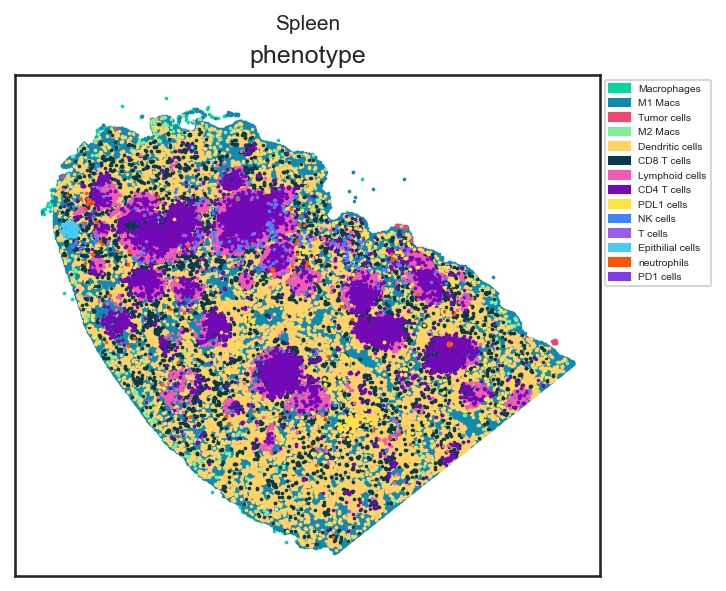

--Tumor--


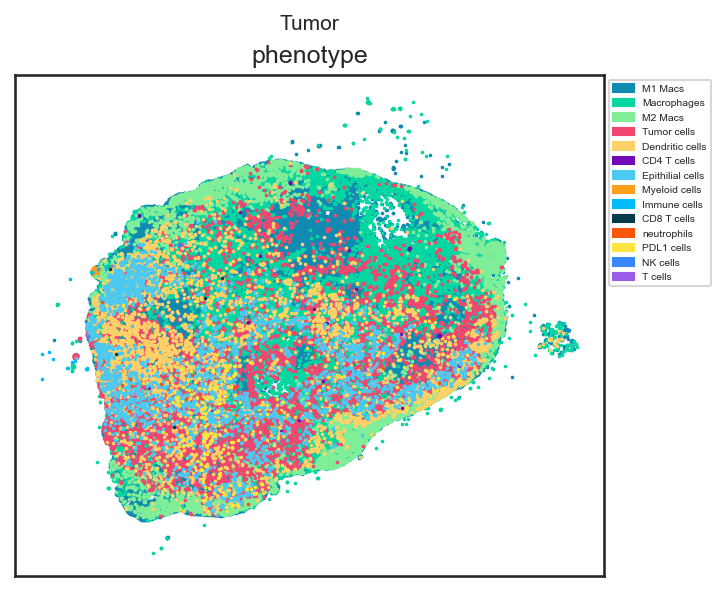

--Tumor2--


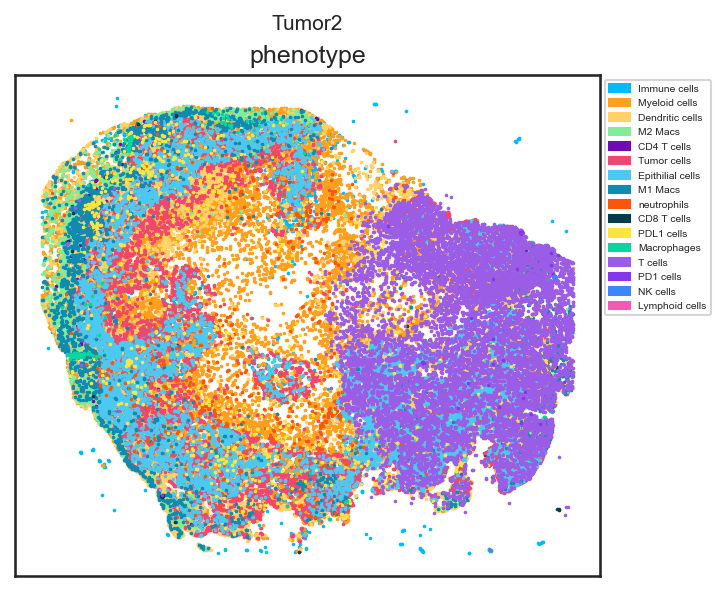

In [9]:
## Same scatter but zoomed into each ROI individually, useful for comparing immune composition between tissue regions 
for roi in rois_to_use:  # loop through each ROI one at a time
    print(f'--{roi}--')
    with titled_plot(roi, fontsize=10, top=0.88):  # spatial_scatterPlot titles each subplot after the
                             # colorBy column name (e.g. "phenotype"), not the ROI -- add our own title
                             # on top. Small figure (5x4in) w/ fontsize=5 internally, so use a smaller
                             # font here too, and top= to make room since tight_layout already ran.
        sm.pl.spatial_scatterPlot(
            adata=adata1,
            colorBy=[phenotype_col],
            imageid=roi_col, # tells scimap the ROI column defines separate images
            subset=roi, # only plot THIS one ROI
            figsize=(5, 4),
            s=3,
            plotLegend=True,
            fontsize=5,
            dpi=150,
            customColors=customColors
        )

In [10]:
## Foldchange, part 1
# First compute the foldchange -- this scimap func looks at how many cells of each type are in each ROI
# and computes log2 fold change compared to the ref ROI (foldchange_from)
# Also runs a Fisher's exact test per cell type to see if the difference
# is statistically significant, then corrects for multiple comparisons

adata1 = sm.tl.foldchange(
    adata1,
    from_group=foldchange_from,  # the reference ROI to compare everything against
    to_group=foldchange_to,  
    imageid=roi_col, # column that identifies the ROIs 
    phenotype=phenotype_col, # column w/ the cell type labels 
    normalize=True,  # normalize cell counts by total cells in each ROI
                     # important b/c without this a bigger ROI would always look like it has more cells 
                     # normalization makes ROIs comparable regarldess of size
    label=foldchange_label # where to store results inside adata1
)

print('Foldchange computed!')
print(f'Results stored in adata1.uns["{foldchange_label}"]')

calculating foldchange
calculating P values
Foldchange computed!
Results stored in adata1.uns["foldchange_roi"]


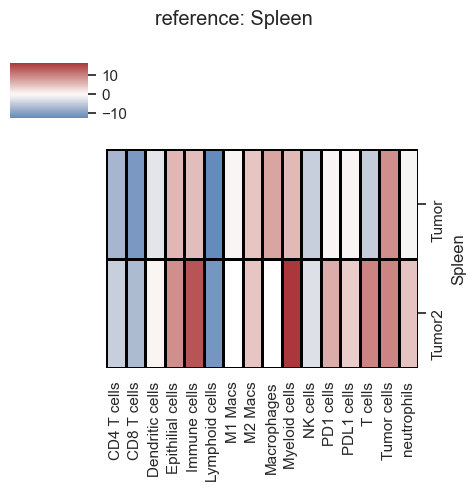

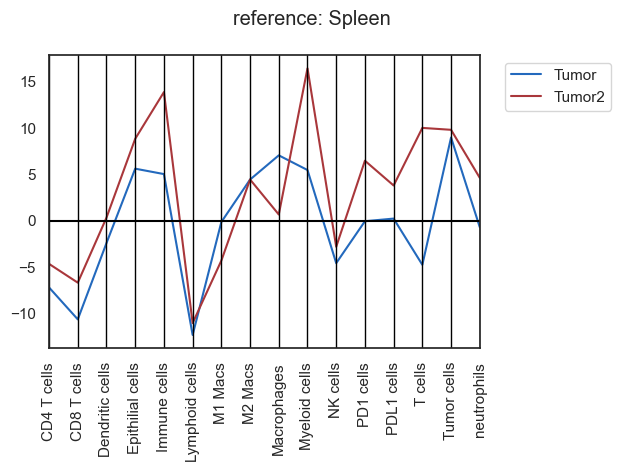

In [11]:
# Foldchange, part 2: plot as a heatmap 
# each row is one cell type, each column is one ROI being compared to the ref ROI
# color = log2 fold change:
# red means this cell type is more abundant in that ROI vs ref and blue means less
# grey means the difference is not statistically significant 
sm.pl.foldchange(
    adata1,
    label=foldchange_label,  # which stored result to plot (must match label above)
    method='heatmap', # display as a heatmap (alternative: 'parallel_coordinates', shown as example on scimap website)
    p_val=0.05,  # significance threshold 
    nonsig_color='grey',   # color for not significant cells in the heatmap
    log=True, # plot log2 fold change 
    figsize=(5, 5),          
    linecolor='black',        
    linewidths=1,
    row_cluster=False,
    col_cluster=False # set these to true if you have 3+ ROIs, otherwise the dendrogram (clutsering) won't work
)

sm.pl.foldchange(
    adata1,
    label=foldchange_label,  # which stored result to plot (must match label above)
    method='parallel_coordinates', # alternate plot type
    p_val=0.05,  # significance threshold 
    nonsig_color='grey',   # color for not significant cells in the heatmap
    log=True # plot log2 fold change         
)

In [12]:
## Scimap spatial interaction
# Computed by comparing real neighbor counts to 100 random permutations

# scimap's subset parameter only accepts a single ROI name, not a list -- so to cover both
# tumor regions we pre-filter adata1 down to just spatial_interaction_rois (excluding Spleen)
# and pass subset=None, which then processes each remaining ROI separately via imageid=roi_col
adata_tumor_regions = adata1[adata1.obs[roi_col].isin(spatial_interaction_rois)].copy()

adata_tumor_regions = sm.tl.spatial_interaction( # tests if cell types neighbor each other more/less than chance
    adata_tumor_regions,
    method='radius', #define neighbors by distance (versus 'knn' which is a fixed number of neighbors)
    radius=interaction_radius, # what we defined as "neighbor" distance
    permutation=100, # number of random permutations to compare against -- lower = faster, less precise p-values
    imageid=roi_col, 
    subset=None, # already filtered to just spatial_interaction_rois above
    phenotype=phenotype_col,
    label='spatial_interaction_radius' #name to store the results under in adata1
)

# Copy the results back onto the full adata1 (which still has Spleen in it) so downstream
# cells that expect adata1.uns['spatial_interaction_radius'] keep working unchanged
adata1.uns['spatial_interaction_radius'] = adata_tumor_regions.uns['spatial_interaction_radius']

print("Spatial interaction computed successfully.")

Processing Image: ['Tumor']
Categories (1, object): ['Tumor']
Identifying neighbours within 76.9 pixels of every cell
Mapping phenotype to neighbors
Performing 100 permutations
Consolidating the permutation results
Processing Image: ['Tumor2']
Categories (1, object): ['Tumor2']
Identifying neighbours within 76.9 pixels of every cell
Mapping phenotype to neighbors
Performing 100 permutations
Consolidating the permutation results
Spatial interaction computed successfully.


--- Tumor ---


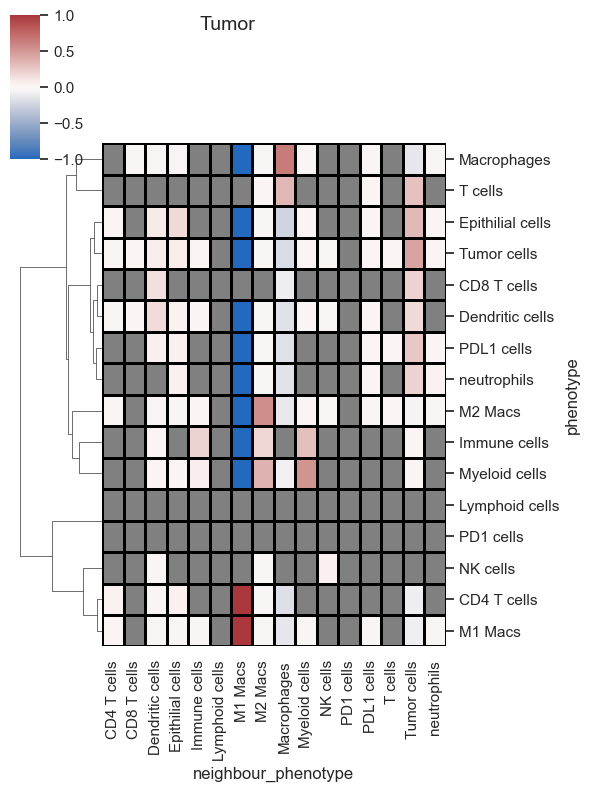

--- Tumor2 ---


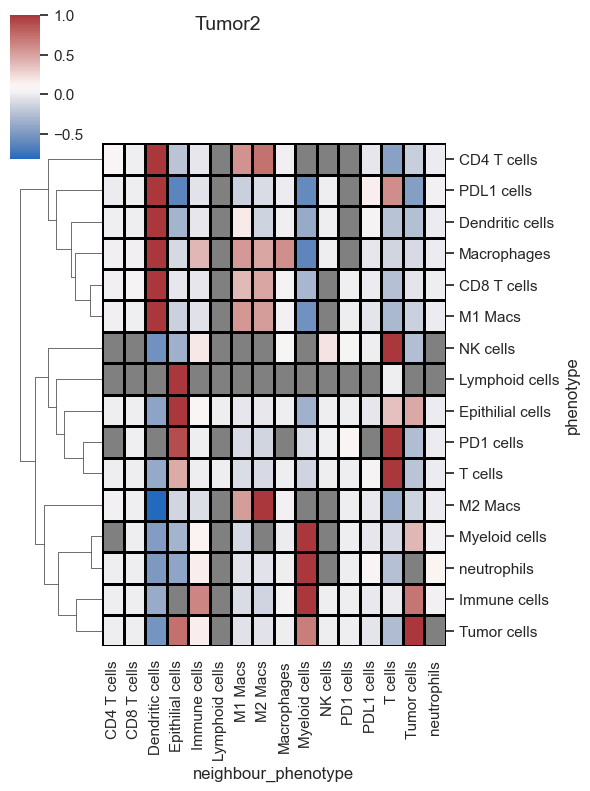

In [13]:
## Plot the results from the previous cell -- one heatmap per ROI instead of columns side by side
# Red --> 2 cell types neighbor each other more than chance
# Blue --> they neighbor each other less than chance
# Grey --> no significant relationship

# To get a separate, compact heatmap per  ROI, we call the function once per ROI 
# on a version of the results containing only that
# ROI's column (scimap names columns after the ROI itself, e.g. 'Tumor' + 'pvalue_Tumor').
# With just 1 column present, summarize_plot=True reshapes it into a clean phenotype x
# neighbor-phenotype grid instead of a long list -- nothing gets averaged since there's
# only ever one column to "average."

full_interaction_results = adata1.uns['spatial_interaction_radius']
adata_interaction_view = adata1[:1].copy()  # 1-cell placeholder, just needs an adata.uns for the plot function to read

for roi in spatial_interaction_rois:
    print(f'--- {roi} ---')
    adata_interaction_view.uns['spatial_interaction_radius'] = full_interaction_results[
        ['phenotype', 'neighbour_phenotype', roi, f'pvalue_{roi}']
    ]
    with titled_plot(roi):  # sm.pl.spatial_interaction's clustermap has no built-in title -- add our own
        sm.pl.spatial_interaction(
            adata_interaction_view,
            spatial_interaction='spatial_interaction_radius',
            yticklabels=True, # show the cell pair labels on the y axis
            figsize=(6, 8),
            row_cluster=True, # group rows with similar patterns together
            summarize_plot=True, # only this one ROI's column is present, so nothing gets averaged across ROIs
            linewidths=0.75,
            linecolor='black'
        )

In [14]:
## Sanity check: how many Tumor-phenotype cells ended up inside the Spleen ROI?
# If this is more than a handful, it likely means the Spleen ROI polygon clipped into
# tumor tissue when drawn, or a few cells were phenotyped incorrectly -- either way,
# this is why Spleen gets excluded from the distance comparisons below.

tumor_cells_in_spleen = ((adata1.obs[roi_col] == 'Spleen') & (adata1.obs[phenotype_col] == 'Tumor cells')).sum()
spleen_total = (adata1.obs[roi_col] == 'Spleen').sum()

print(f'Tumor cells phenotyped inside the Spleen ROI: {tumor_cells_in_spleen:,} / {spleen_total:,} Spleen cells ({tumor_cells_in_spleen / spleen_total:.2%})')
print('\nFull phenotype breakdown within Spleen ROI:')
print(adata1.obs.loc[adata1.obs[roi_col] == 'Spleen', phenotype_col].value_counts())

Tumor cells phenotyped inside the Spleen ROI: 67 / 397,607 Spleen cells (0.02%)

Full phenotype breakdown within Spleen ROI:
phenotype
M1 Macs             298981
Dendritic cells      59686
CD8 T cells          15402
CD4 T cells          11349
Lymphoid cells        9903
M2 Macs                840
Macrophages            450
PDL1 cells             399
NK cells               230
Epithilial cells       143
neutrophils            103
Tumor cells             67
T cells                 52
PD1 cells                2
Immune cells             0
Myeloid cells            0
Name: count, dtype: int64


In [15]:
## Compute spatial distances 
# For each cell in the dataset, this finds the nearest cell of each OTHER type
# Results are stored inside adata1 for plotting below

# Restricted to distance_rois (excludes Spleen, see sanity check above). Note: unlike
# spatial_interaction/spatial_aggregate, scimap's spatial_distance subset param -- if given
# a list -- treats every matching cell as ONE combined group rather than processing each
# ROI separately, which would incorrectly let a Tumor cell's "nearest neighbor" be a cell
# physically in Tumor2. So we pre-filter to distance_rois ourselves and pass subset=None,
# which processes each remaining ROI separately via imageid=roi_col instead.
adata_tumor_distance = adata1[adata1.obs[roi_col].isin(distance_rois)].copy()

adata_tumor_distance = sm.tl.spatial_distance(
    adata_tumor_distance,
    x_coordinate='X_centroid',  
    y_coordinate='Y_centroid',   
    phenotype=phenotype_col,     
    imageid=roi_col, # column identifying the ROI -- runs separately per ROI so we can compare distances across ROIs
    subset=None, # already filtered to just distance_rois above
    label='spatial_distance' # name to store results under in adata1
)

# Copy the results back onto the full adata1 (which still has Spleen in it) so adata1.obs
# stays intact -- the distance table itself is indexed by cell ID and only contains
# Tumor/Tumor2 cells, so Spleen is automatically excluded from everything downstream
adata1.uns['spatial_distance'] = adata_tumor_distance.uns['spatial_distance']

print('Spatial distances computed!')
print('Results stored in adata1.uns["spatial_distance"]')

Processing Image: Tumor
Processing Image: Tumor2
Spatial distances computed!
Results stored in adata1.uns["spatial_distance"]


In [16]:
# Get the ROI for each cell
spatial_dist_df = adata1.uns['spatial_distance'].copy()
spatial_dist_df['ROI'] = adata1.obs.loc[spatial_dist_df.index, roi_col] # match by cell ID (index), not row position --
                                                                        # spatial_dist_df is now shorter than adata1.obs
                                                                        # since Spleen was excluded from the distance calc

# Now group by ROI and describe
#spatial_dist_df.groupby('ROI').describe()

spatial_dist_df.groupby('ROI').mean()

print(spatial_dist_df['ROI'].unique())

['Tumor', 'Tumor2']
Categories (3, object): ['Spleen', 'Tumor', 'Tumor2']



=== Tumor ===


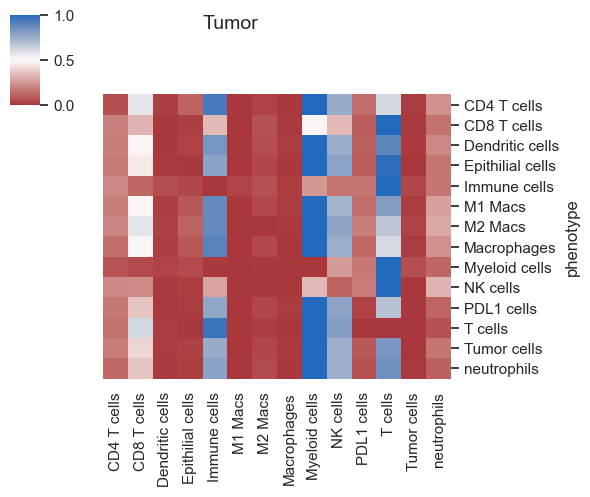


=== Tumor2 ===


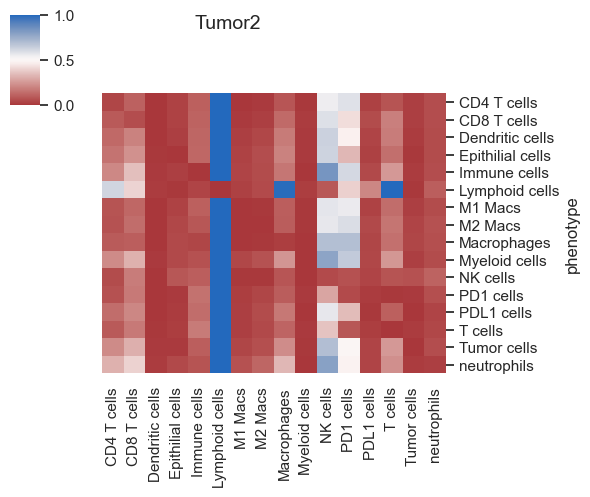

In [17]:
## Heatmap of all pairwise distances 
# Shows the average distance between every pair of cell types at once
# Each grid cell represents the avg distance in pixels between the row type and column type
# Red is closer together, blue is farther
# Quick overview, use to spot which cell types are generally close to or far from each other before looking at details

# Loop over distance_rois specifically (not adata1.obs[roi_col].unique()) -- Spleen has no
# spatial_distance data anymore since it was excluded from the computation above
for roi in distance_rois:
    adata_roi = adata1[adata1.obs[roi_col] == roi]
    print(f"\n=== {roi} ===")
    with titled_plot(roi):  # sm.pl.spatial_distance's clustermap has no built-in title -- add our own
        sm.pl.spatial_distance(
            adata_roi,
            method='heatmap',
            label='spatial_distance',
            figsize=(6, 5)
        )


--Distance to neutrophils--


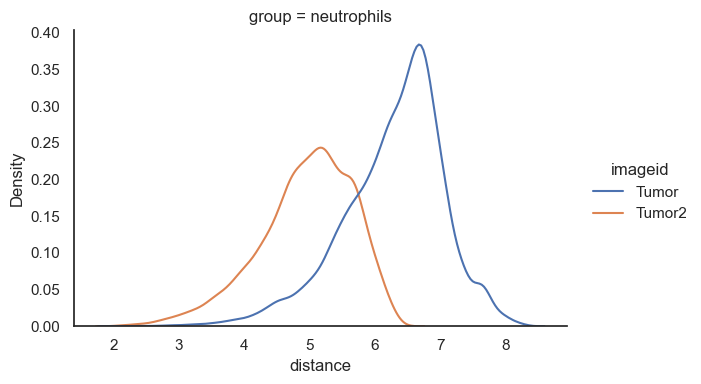


--Distance to PDL1 cells--


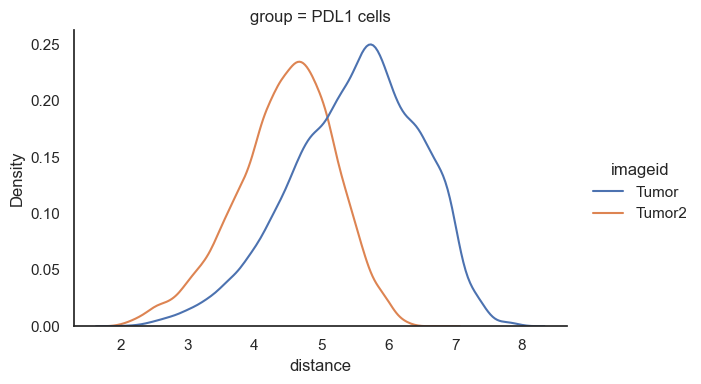


--Distance to PD1 cells--


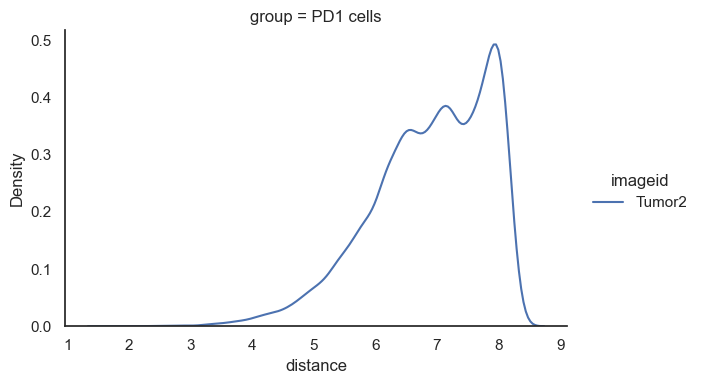


--Distance to M2 Macs--


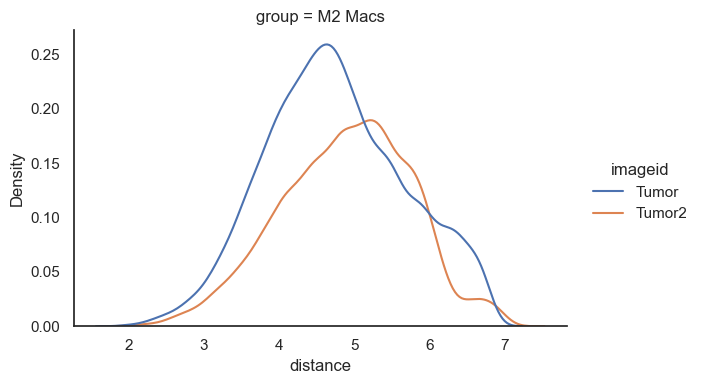


--Distance to M1 Macs--


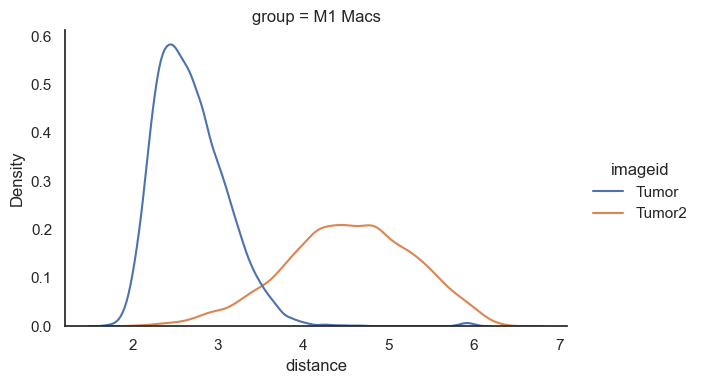


--Distance to Epithilial cells--


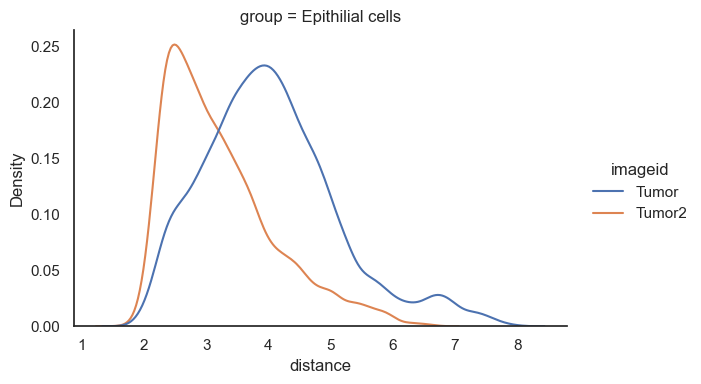


--Distance to Dendritic cells--


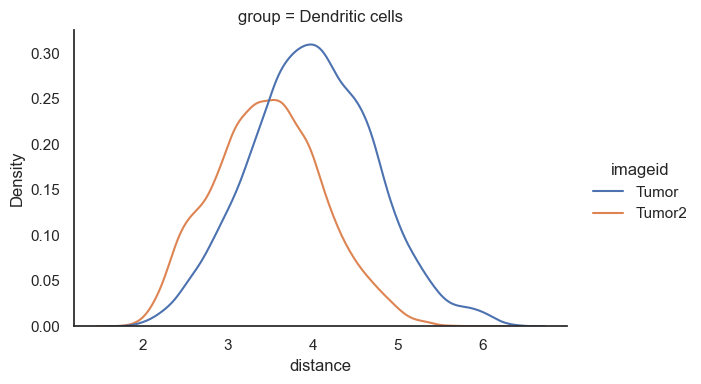


--Distance to CD8 T cells--


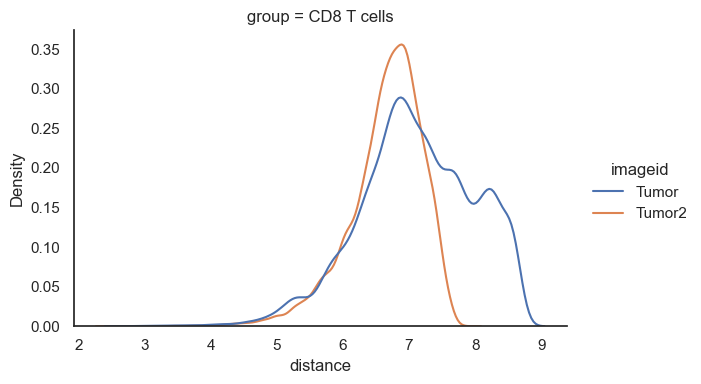


--Distance to CD4 T cells--


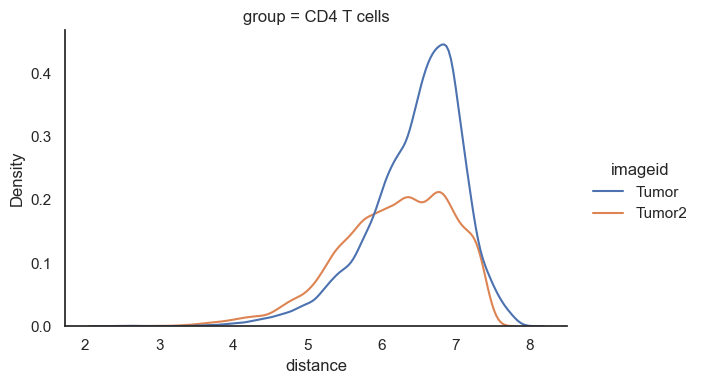

In [18]:
## Distribution plots of distance from each immune cell type to nearest tumor cell 
# 1 plot per immune cell type in distance_to
# Within each plot, split by ROI so you can compare across regions

# Restrict to distance_rois -- Spleen cells are still in adata1.obs but have no
# spatial_distance data anymore, so passing the full adata1 here would try to include
# an empty/broken Spleen group in the split
adata_distance_view = adata1[adata1.obs[roi_col].isin(distance_rois)].copy()
adata_distance_view.obs[roi_col] = adata_distance_view.obs[roi_col].cat.remove_unused_categories()  # ROI is
    # categorical with Spleen still defined as a category even though no rows have it --
    # drop it so it doesn't show up as an empty group in the split

for cell_type in distance_to:  # loop through each cell type one at a time -- so each plot is clear even when we have many cell types
    print(f"\n--Distance to {cell_type}--")

    # NOTE: sm.pl.spatial_distance(method='distribution') calls seaborn's sns.displot() internally,
    # which is a figure-level function that always builds, displays, AND closes its own figure
    # (it calls plt.show() itself since we don't pass saveDir) -- it can't be pointed at a figure we
    # create beforehand or resized afterward via plt.gcf(), since by then that figure is already gone.
    # Either one just leaves/creates a second, empty figure that Jupyter's inline plt.show() also
    # displays, showing up as a stray "<Figure size ... with 0 Axes>". Size it via height/aspect
    # kwargs instead, which get passed straight through to sns.displot.
    sm.pl.spatial_distance(
        adata_distance_view,
        method='distribution',   # show as distribution plots
        distance_from=distance_from,  # measure FROM this cell type
        distance_to=[cell_type],  # only this cell type
        imageid=roi_col, # split each violin by ROI
        label='spatial_distance',  # which stored result to use
        log=True, # log scale on the distance axis bc distance span a wide range
        height=4, aspect=1.5,
    )


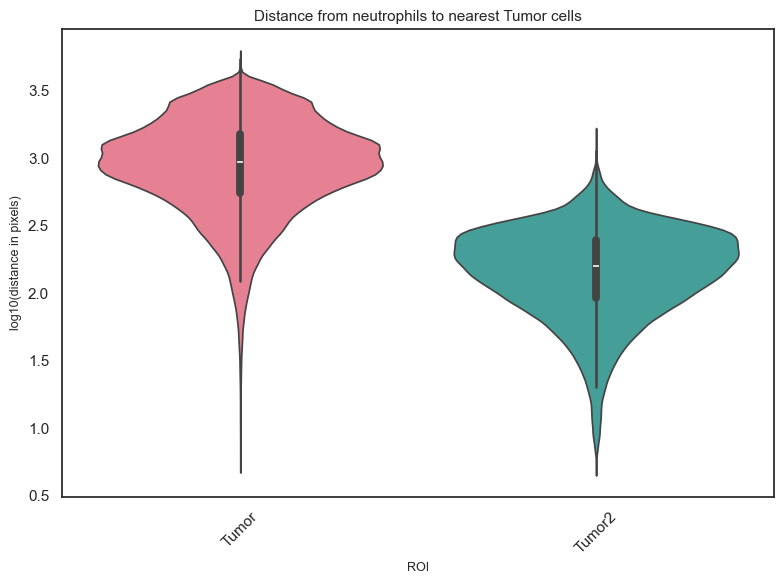

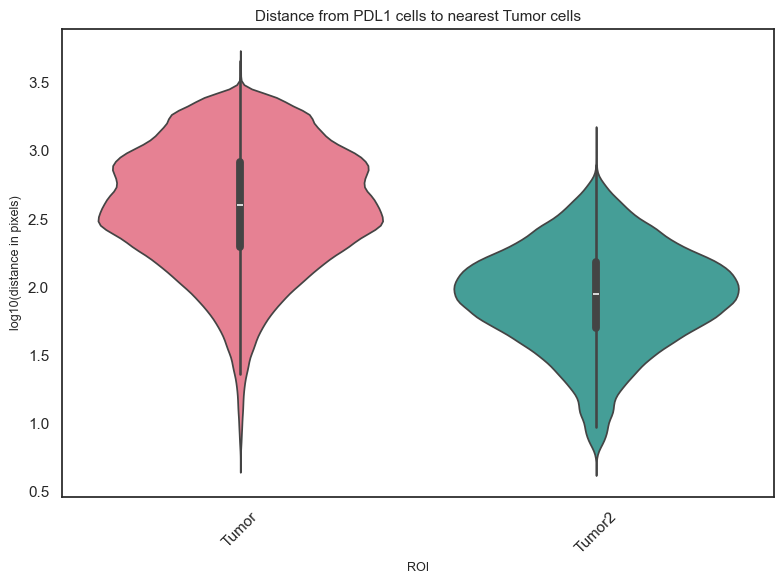

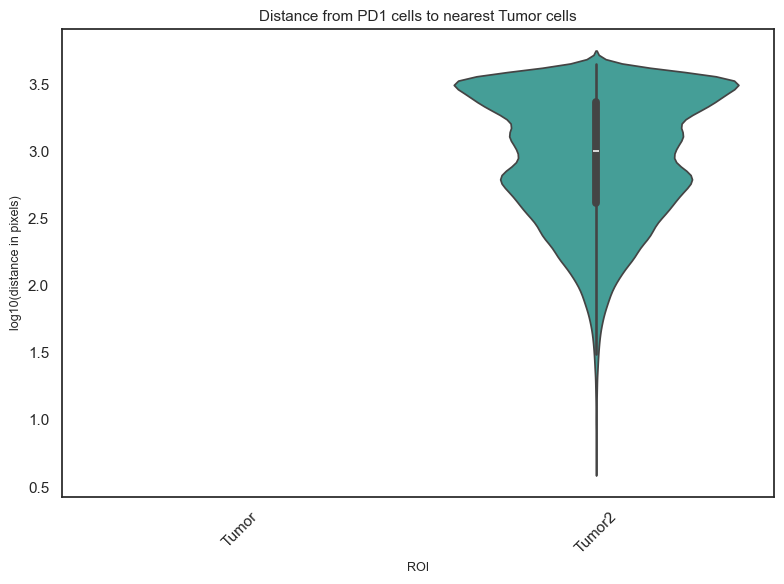

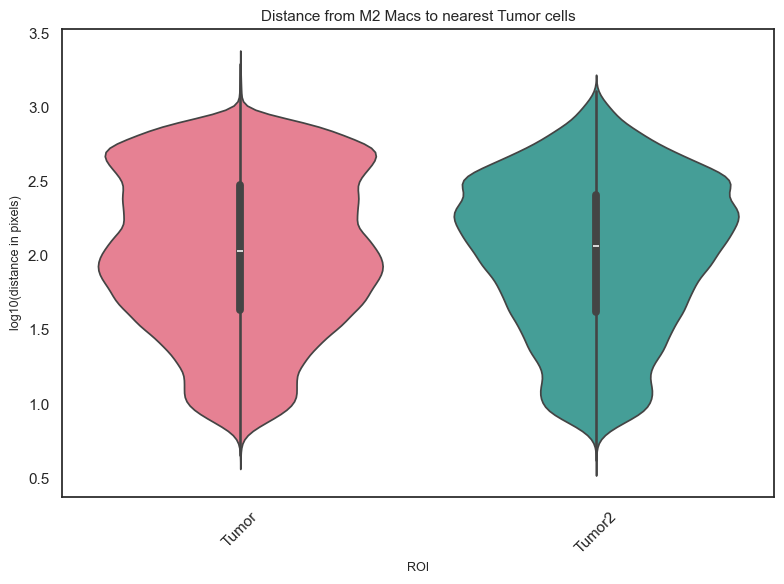

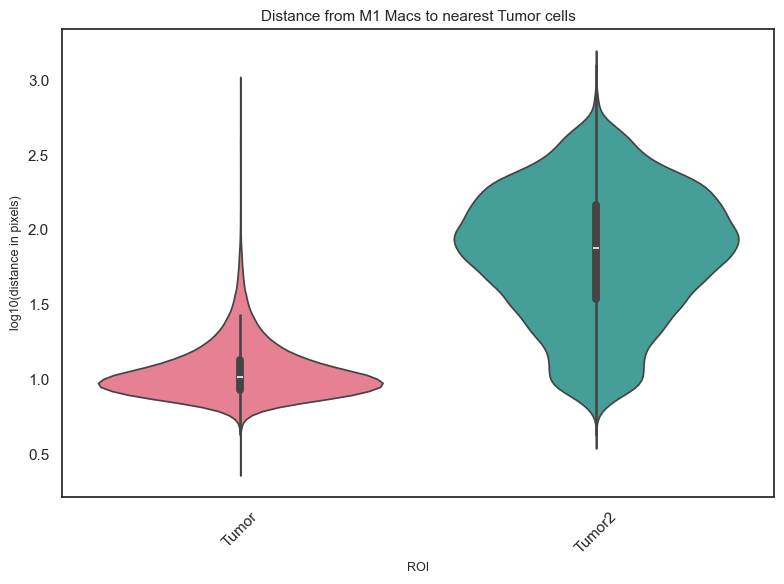

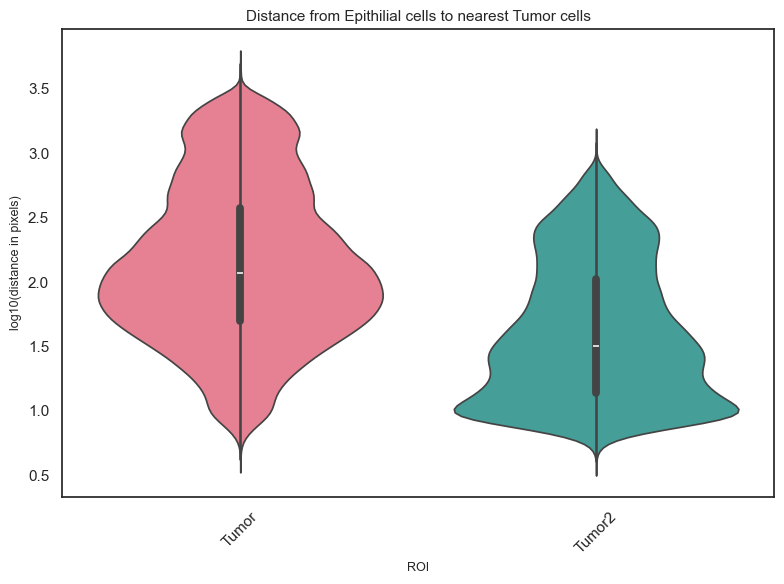

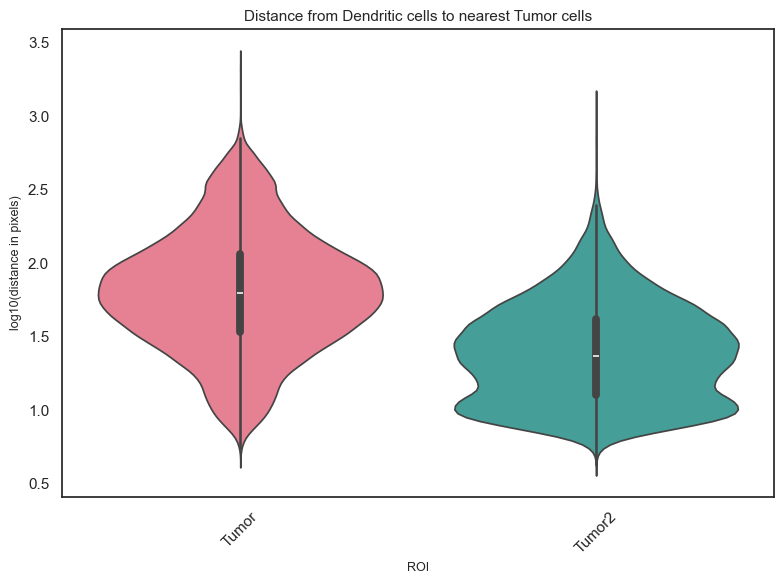

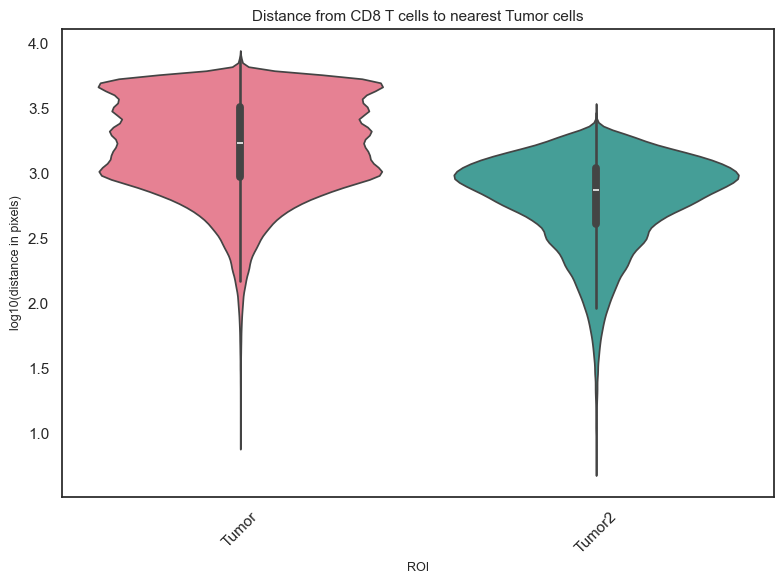

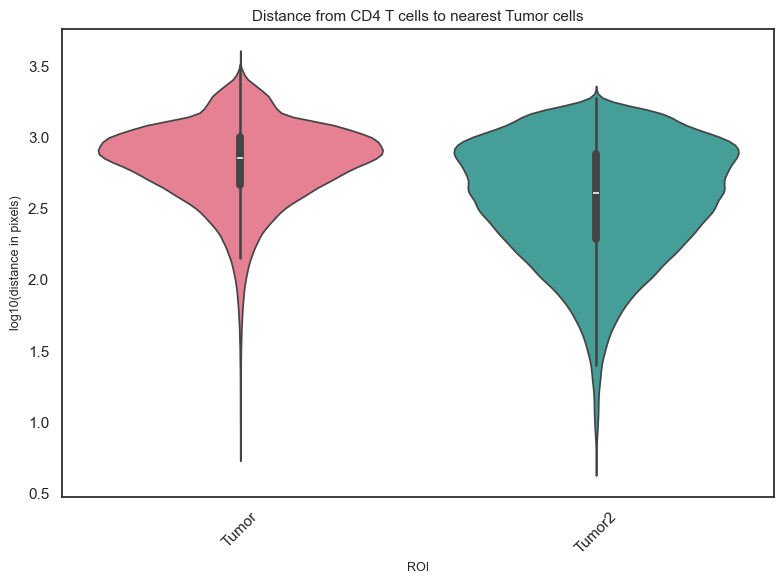

In [19]:
## Violin plots of spatial distances
# Pull the distance table out of adata1, where one row = one cell and one column per cell type showing distance to nearest
# cell of that type

dist_data = adata1.uns['spatial_distance'].copy()   # work on a copy

# add ROI column by looking up each cell's ROI label from adata1.obs
# dist_data.index contains the cell IDs and we use those to look up the matching ROI 
dist_data['ROI'] = adata1.obs.loc[dist_data.index, roi_col]
dist_data['ROI'] = dist_data['ROI'].cat.remove_unused_categories()  # ROI is categorical with Spleen
                                                                    # still defined as a category even though
                                                                    # no rows have it -- drop it so it doesn't
                                                                    # show up as an empty violin

# Need to reshape from wide to long format because seaborn (use to make the plots) needs this
# wide is one row per cell, one column per cell type 
# long is one row per (cell + cell type) combo
dist_long = dist_data[distance_to + ['ROI']].melt(
    id_vars='ROI',  # keep ROI as an identifier column, don't need to reshape this one
    var_name='cell_type', # the column names (CD8+ T cells etc) are now going to be values in this new column
    value_name='distance' # the actual distance numbers will now go into this column
)

# Force the distances to be numeric 
# scimap sometimes stores distances as categorical data type (a lookup table) instead of numbers

dist_long['distance'] = pd.to_numeric(dist_long['distance'], errors='coerce')

# Log transform the distances (They span a wide range)
dist_long['log_distance'] = np.log10(dist_long['distance'])

# One subplot per immune cell type 
# within each subplot we have one violin per ROI

for cell_type in distance_to:  # loop through each immune cell type, one full figure per type (clear even w/ many cell types)
    fig, ax = plt.subplots(figsize=(8, 6))  # one full width figure per cell type
    # filter to only the rows for this specific cell type
    subset = dist_long[dist_long['cell_type'] == cell_type]
    sns.violinplot(
        data=subset,
        x='ROI',
        y='log_distance',
        inner='box',
        ax=ax,
        hue='ROI',
        palette='husl'
    )
    ax.set_title(f'Distance from {cell_type} to nearest {distance_from}', fontsize=11)
    ax.set_xlabel('ROI', fontsize=9)
    ax.set_ylabel('log10(distance in pixels)', fontsize=9)
    ax.tick_params(axis='x', rotation=45)
    plt.tight_layout()
    plt.show()

In [20]:
# Custom func to compute raw pairwise interaction counts using scipy, different from the scimap version above 
# this one counts actual occurrences -- for each cell, how many neighbors of each cell type fall within the radius

def spatial_interaction_working(adata, radius=interaction_radius, phenotype_col='phenotype', imageid_col='ROI'):
    """
    Purpose
    -------
    Count raw pairwise cell type interactions within a radius for each ROI

    Parameters
    ----------
    adata : AnnData
        The dataset, must have "X_centroid" and "Y_centroid" in adata.obs
    radius : int
        Neighbor search distance in pixels
    phenotype_col : str
        Name of the obs column w/ cell type labels
    imageid_col : str
        Name of the obs column that separates regions

    Returns
    -------
    pd.DataFrame
        One row per (ROI, cell type, neighbor cell type) w/ an interaction count
    """

    
    print('Starting spatial interaction analysis...')
    all_results = [] # empty list to collect results

    for roi in adata.obs[imageid_col].unique(): # loop over each unique ROI
        if roi == 'Other': # skip cells outside any ROI -- should be fine, this is another safety net
            continue                                    
        print(f'Processing {roi}...')            

        roi_data = adata[adata.obs[imageid_col] == roi].copy() # subset to just this ROI (independent copy)
        if len(roi_data) < 2: # need at least 2 cells to have a pair (safety check)
            continue  

        coords = np.array([  # build an array of positions -- 2 rows x (number of cells) columns
            roi_data.obs['X_centroid'].values,  # all x positions
            roi_data.obs['Y_centroid'].values  # all y positions
        ]).T.astype(np.float64)  # .T flips it to rows=cells

        phenotypes = roi_data.obs[phenotype_col].values  # cell type label for each cell, same order as coords

        # Find every pair of cells within radius of each other using a KD-tree instead of a full NxN distance matrix
        # query_pairs only ever materializes pairs that are actually within radius, so it
        # scales with how many neighbors cells actually have, not with cell count squared.
        tree = cKDTree(coords)
        pairs = tree.query_pairs(r=radius, output_type='ndarray')  # each unordered pair {i, j} appears once

        interaction_counts = {}  # dict for counting
        for i, j in pairs:  # every pair within radius is a neighbor relationship in BOTH directions --
                            # i.e. j is a neighbor of i, AND i is a neighbor of j -- same as the original
                            # center-cell loop counted both directions for every pair within radius
            key_ij = (roi, phenotypes[i], phenotypes[j])
            interaction_counts[key_ij] = interaction_counts.get(key_ij, 0) + 1
            key_ji = (roi, phenotypes[j], phenotypes[i])
            interaction_counts[key_ji] = interaction_counts.get(key_ji, 0) + 1

        for (roi_name, pheno1, pheno2), count in interaction_counts.items():  # unpack each cell neighbor pair 
            all_results.append({  # add a row to our results list
                'ROI': roi_name,
                'phenotype': pheno1,
                'neighbor_phenotype': pheno2,
                'interaction_count': count
            })
        print(f'{roi} done!')                 

    results_df = pd.DataFrame(all_results) # turn the list of dicts into a dataframe
    print(f'\nComplete! {len(results_df)} interaction pairs found')  
    return results_df  
    

print(f"Function 'spatial_interaction_working' defined")

Function 'spatial_interaction_working' defined


In [21]:
# Here we actually run the raw counts function

# Restricted to spatial_interaction_rois (['Tumor', 'Tumor2']) -- excludes Spleen
spatial_results = spatial_interaction_working(
    adata1[adata1.obs[roi_col].isin(spatial_interaction_rois)],
    radius=interaction_radius,
    phenotype_col=phenotype_col,
    imageid_col=roi_col
)

Starting spatial interaction analysis...
Processing Tumor...
Tumor done!
Processing Tumor2...
Tumor2 done!

Complete! 359 interaction pairs found


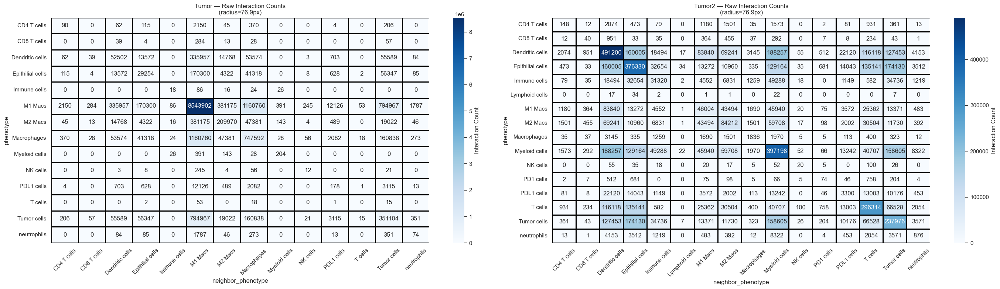

In [22]:
# One heatmap per ROI showing the raw interaction counts between every cell type pair
# Each grid cell is how many times the row type was found within the radius of column type
# Compare across ROIs!


rois_in_results = spatial_results['ROI'].unique()  # list of ROIs that produced results
fig, axes = plt.subplots(1, len(rois_in_results), # one subplot column (panel) per ROI
                         figsize=(14 * len(rois_in_results), 8)) #  scale width by number of ROIs
if len(rois_in_results) == 1:  # matplotlib quirk that 1 subplot isn't a list
    axes = [axes]

for i, roi in enumerate(rois_in_results): # loop over each ROI with its index i
    roi_data = spatial_results[spatial_results['ROI'] == roi] # rows for just this ROI from spatial_results
    matrix = roi_data.pivot(  # reshape long table into a grid
        index='phenotype',# rows --> center cell type
        columns='neighbor_phenotype', # columns --> neighbor cell type
        values='interaction_count' #grid values --> counts
    ).fillna(0)

    sns.heatmap( # draw the heatmap
        matrix,
        annot=True, fmt='.0f', # write number in each cell, no decimals
        cmap='Blues',     
        linewidths=0.75, linecolor='black',             
        ax=axes[i], # draw on the ith subplot
        cbar_kws={'label': 'Interaction Count'} # colorbar label
    )
    axes[i].set_title(f'{roi} — Raw Interaction Counts\n(radius={interaction_radius}px)')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

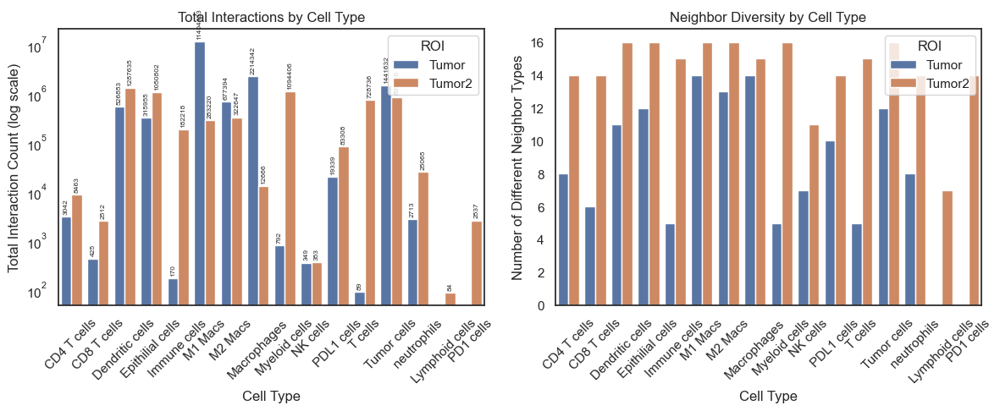

In [23]:
# Left shows the total interactions per cell type per ROI
# Right shows neighbor diversity -- so how many DIFFERENT cell types does each type interact with

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5)) # two subplots side by side

summary = (spatial_results  # start from the results table
           .groupby(['ROI', 'phenotype'])  # group rows by ROI and cell type
           ['interaction_count']  # we care about the count column
           .sum()   # total interactions per group
           .reset_index())  # turn the grouped result back into a flat table

sns.barplot(data=summary, x='phenotype', y='interaction_count',  # bar plot of totals
            hue='ROI', ax=ax1)     # one bar color per ROI, draw on left subplot
ax1.set_yscale('log')  # log scale -- counts here span a wide range, so a linear axis
                       # makes high-interaction cell types (e.g. Lymphoid) dwarf low-frequency
                       # ones (e.g. PD1 cells), even though we want to directly compare all of them
for container in ax1.containers:  # one container per hue (ROI) group
    ax1.bar_label(container, fmt='%.0f', fontsize=6, rotation=90, padding=2)  # exact count on top of each bar,
                                                                              # since the log scale makes it hard to read small differences by eye
ax1.set_title('Total Interactions by Cell Type')  
ax1.set_xlabel('Cell Type')                           
ax1.set_ylabel('Total Interaction Count (log scale)')           
ax1.tick_params(axis='x', rotation=45)   # rotate labels

diversity = (spatial_results    # start from results again
             .groupby(['ROI', 'phenotype'])   # group by ROI and cell type
             ['neighbor_phenotype']  # look at the neighbor type column
             .nunique()   # count how many DIFFERENT neighbor types
             .reset_index()) # flatten back to a table

diversity.columns = ['ROI', 'phenotype', 'neighbor_diversity']  # rename for clarity
sns.barplot(data=diversity, x='phenotype', y='neighbor_diversity',  # bar plot of diversity
            hue='ROI', ax=ax2)  

ax2.set_title('Neighbor Diversity by Cell Type')       
ax2.set_xlabel('Cell Type')                          
ax2.set_ylabel('Number of Different Neighbor Types')    
ax2.tick_params(axis='x', rotation=45)                  

plt.tight_layout()
plt.show()

--- Tumor ---
Downsampled to 14,998 cells for faster Voronoi rendering (voronoi_max_cells=15,000)
Plotting voronoi for Tumor: 14,998 cells
Saved plot to C:/Users/kelse/OneDrive - The Mount Sinai Hospital/02_Presentations/Platforma_MCMICRO_Tutorial_Docs/MCMICRO_Python_Analysis/analysis/plots\voronoi_Tumor.png


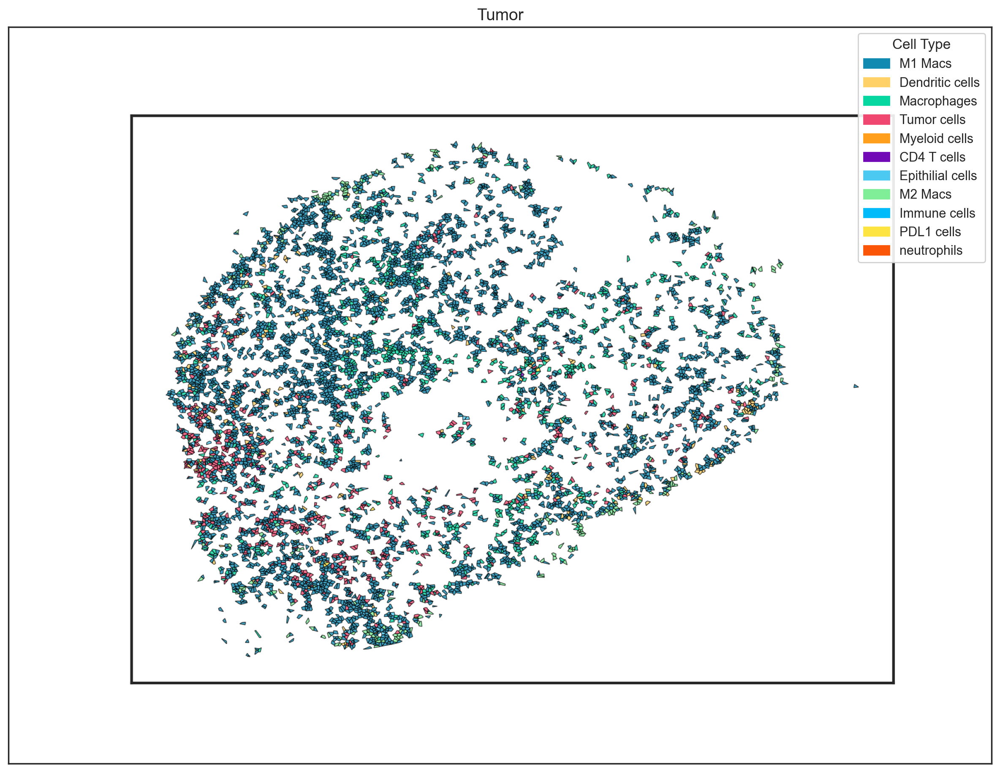

--- Tumor2 ---
Downsampled to 15,002 cells for faster Voronoi rendering (voronoi_max_cells=15,000)
Plotting voronoi for Tumor2: 15,002 cells
Saved plot to C:/Users/kelse/OneDrive - The Mount Sinai Hospital/02_Presentations/Platforma_MCMICRO_Tutorial_Docs/MCMICRO_Python_Analysis/analysis/plots\voronoi_Tumor2.png


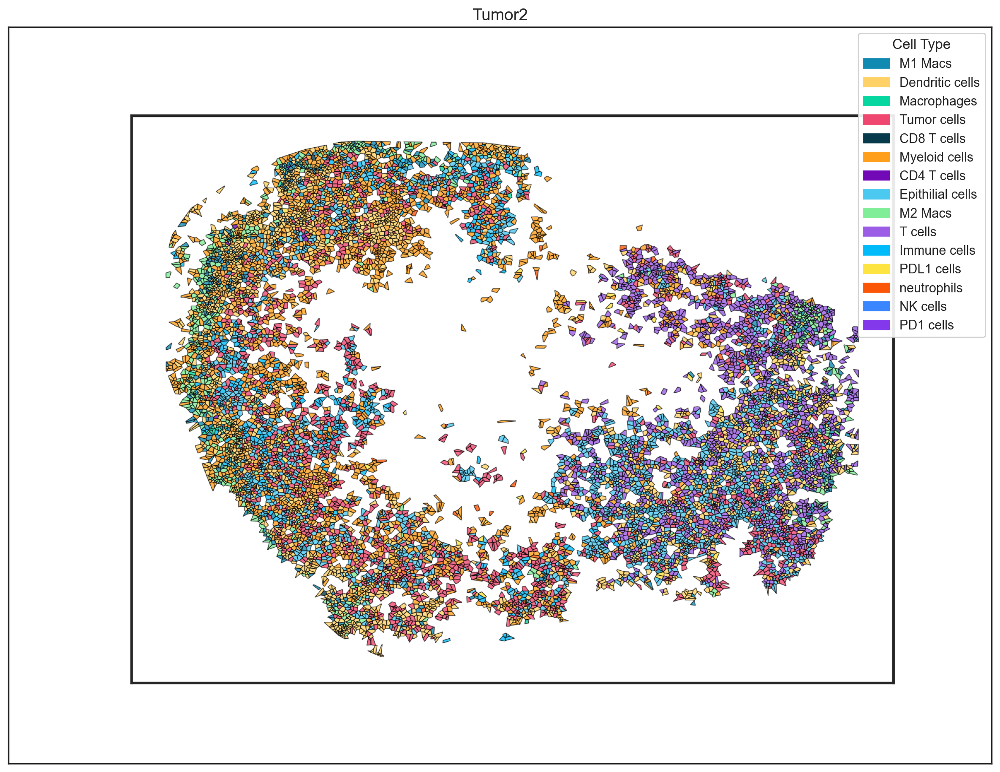

In [24]:
## Voronoi tissue map: every cell gets drawn as a colored polygon instead of just a dot
# One image per ROI in voronoi_rois -- each ROI's polygons/neighbors are computed independently
# (imageid isn't even involved here, we just subset to one ROI's cells at a time per loop iteration,
# so a Tumor cell's polygon never touches Tumor2's cells or vice versa)

for roi in voronoi_rois:
    print(f'--- {roi} ---')

    # Subset to just this ROI
    adata_roi = adata1[adata1.obs[roi_col] == roi].copy() # boolean mask: keep only cells in this ROI + work on a copy

    # Downsample for speed -- Voronoi computes + draws one polygon per cell, so it gets slow
    # past tens of thousands of cells. Stratified by phenotype_col so rare cell types aren't
    # sampled away and the composition still looks representative at a glance.
    if voronoi_max_cells is not None and adata_roi.n_obs > voronoi_max_cells:
        frac = voronoi_max_cells / adata_roi.n_obs
        sampled_idx = (adata_roi.obs
                       .groupby(phenotype_col, group_keys=False)
                       .sample(frac=frac, random_state=0)  # fixed seed so the plot is reproducible across reruns
                       .index)
        adata_roi = adata_roi[sampled_idx].copy()
        print(f'Downsampled to {adata_roi.n_obs:,} cells for faster Voronoi rendering (voronoi_max_cells={voronoi_max_cells:,})')

    print(f'Plotting voronoi for {roi}: {adata_roi.n_obs:,} cells')

    voronoi_filename = f'voronoi_{roi}.png'  # separate filename per ROI so plots don't overwrite each other

    # Run scimap voronoi and save directly to a file 
    # Here we save to a file instead of displaying because scimap always opens its own figure internally 
    # if we just call plt.show() the legend ends up on a separate empty plot
    sm.pl.voronoi(
        adata_roi,
        color_by=phenotype_col, # color by cell type
        voronoi_edge_color='black',  # thin black border between polygons
        voronoi_line_width=0.3,  
        voronoi_alpha=0.8, # polygon opacity
        size_max=voronoi_size_max, # maximum area any single polygon is allowed to be
        overlay_points=None, # don't draw dots on top of polygons (cleaner)
        plot_legend=False, # turn OFF scimap's built-in legend, draw our own below
        legend_size=6,
        colors=customColors, # use our defined colors
        saveDir=voronoi_save_dir, # folder to save the image to
        fileName=voronoi_filename # filename for the saved image
    )
    #  define the actual (final) path name after scimap saves the image
    voronoi_actual_path = os.path.join(voronoi_save_dir, voronoi_filename)

    # Now, we reload the saved image and add our legend on top 
    # Here we get full control of the figure because we make it ourselves with plt.subplots()
    # scimap's figure is gone, we're working with a flat image loaded from where we saved it

    # Load from that path
    img = Image.open(voronoi_actual_path)

    fig, ax = plt.subplots(figsize=(12, 12), dpi=200)  # create our own high res figure
                                                    
    ax.imshow(img) # draw the voronoi image onto our axes
    ax.set_xticks([]) # hide x axis tick marks 
    ax.set_yticks([]) # hide y-axis tick marks

    # Finally build and add the legend manually 
    # mpatches.Patch makes one colored rectangle per cell type
    # Filter to only include cell types that actually exist in this ROI
    legend_patches = [
        mpatches.Patch(color=color, label=cell_type)           # colored square + label
        for cell_type, color in customColors.items()           # loop through all defined colors
        if cell_type in adata_roi.obs[phenotype_col].values    # only include if present in this ROI
    ]

    ax.legend(
        handles=legend_patches,  # the list of colored squares we just built
        loc='upper right',  # position on the plot
        fontsize=11,              
        framealpha=0.9, # legend box background opacity 
        title='Cell Type',      
        title_fontsize=12       
    )

    ax.set_title(roi, fontsize=14)  # label which ROI this is, since there's now more than one

    plt.tight_layout() # auto adjust spacing so nothing gets cut off
    # Overwrite the bare version scimap saved above with this one -- this is the actual
    # figure the notebook displays (image + our own legend), so it's the one that should
    # end up on disk. Save before show(), since Jupyter's inline backend closes the figure
    # as part of showing it, so saving after show() would silently save a blank figure instead
    plt.savefig(voronoi_actual_path, dpi=200, bbox_inches='tight')
    plt.show()

In [25]:
## First, find dense spatial clusters of each cell type 
# Looks at every cell and checks what fraction of its neighbors are the same cell type as itself
# If that fraction is >= aggregate_purity then the cell gets labeled with its cell type as a "pure aggregate" region
# If the fraction is below --> gets labeled "other" meaning it's in a mixed region 

# scimap's subset parameter only accepts a single ROI name, not a list -- so to cover both
# tumor regions we pre-filter adata1 down to just aggregate_rois (excluding Spleen) and pass
# subset=None. imageid=roi_col still keeps the neighbor search separate per ROI, so a Tumor
# cell's neighbors are never looked up in Tumor2 (or vice versa) -- each ROI is processed
# independently, same as Tumor was already kept separate from Spleen.
adata_tumor_agg = adata1[adata1.obs[roi_col].isin(aggregate_rois)].copy()

adata_tumor_agg = sm.tl.spatial_aggregate(
    adata_tumor_agg,
    phenotype=phenotype_col,  # column w/ cell type labels
    method='radius',  # define neighborhood by distance
    radius=aggregate_radius,   
    purity=aggregate_purity,    
    imageid=roi_col, # run separately per ROI
    subset=None, # already filtered to just aggregate_rois above
    label=aggregate_label # name of the new column added 
)

# Copy the results back onto the full adata1 (which still has Spleen in it) so downstream
# cells that expect adata1.obs[aggregate_label] keep working unchanged. Spleen cells get NaN
# here since they were never in the filtered subset -- same as before.
adata1.obs[aggregate_label] = adata_tumor_agg.obs[aggregate_label].reindex(adata1.obs.index)

print('Spatial aggregation complete!')
print(f'New column "{aggregate_label}" added to adata1.obs')
print('\nAggregate region counts:')
print(adata1.obs[aggregate_label].value_counts())

Identifying neighbours within 46.2 pixels of every cell
Identifying neighbours within 46.2 pixels of every cell
Spatial aggregation complete!
New column "spatial_aggregate" added to adata1.obs

Aggregate region counts:
spatial_aggregate
non-significant     203432
M1 Macs              79559
Myeloid cells         3505
Macrophages           3307
Dendritic cells       1577
T cells               1414
Tumor cells            764
M2 Macs                591
Epithilial cells       436
Immune cells           126
neutrophils             19
PDL1 cells               3
CD8 T cells              3
Name: count, dtype: int64


--- Tumor ---
Downsampled to 14,999 cells for faster Voronoi rendering (voronoi_max_cells=15,000)
Saved plot to C:/Users/kelse/OneDrive - The Mount Sinai Hospital/02_Presentations/Platforma_MCMICRO_Tutorial_Docs/MCMICRO_Python_Analysis/analysis/plots\voronoi_aggregate_Tumor.png


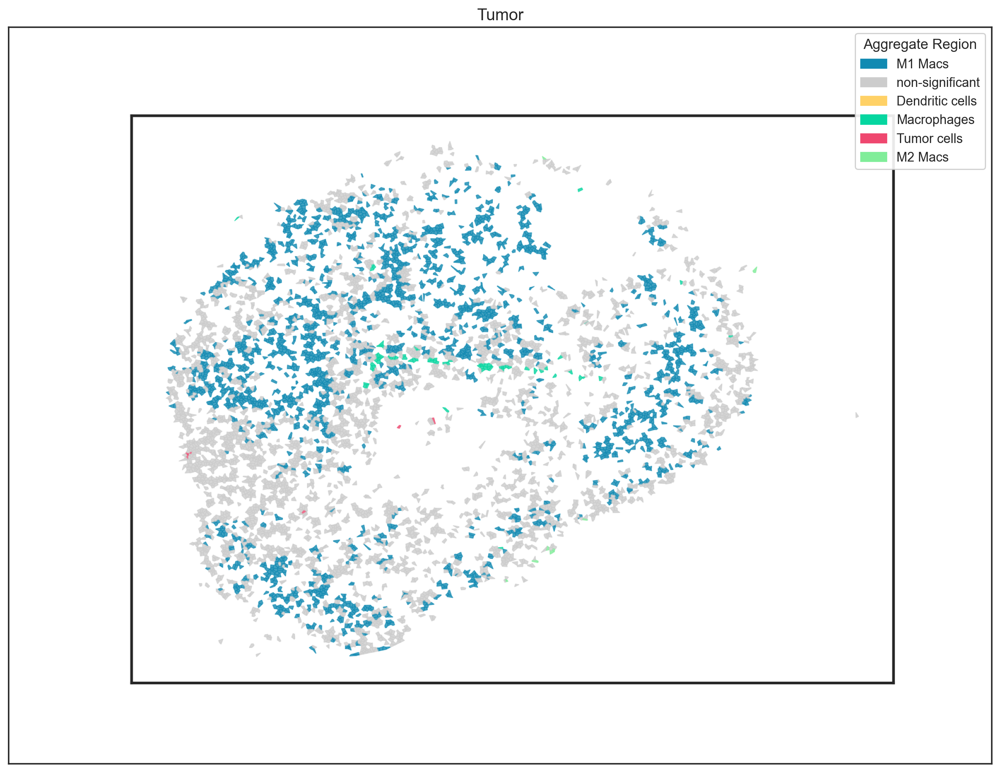

--- Tumor2 ---
Downsampled to 15,001 cells for faster Voronoi rendering (voronoi_max_cells=15,000)
Saved plot to C:/Users/kelse/OneDrive - The Mount Sinai Hospital/02_Presentations/Platforma_MCMICRO_Tutorial_Docs/MCMICRO_Python_Analysis/analysis/plots\voronoi_aggregate_Tumor2.png


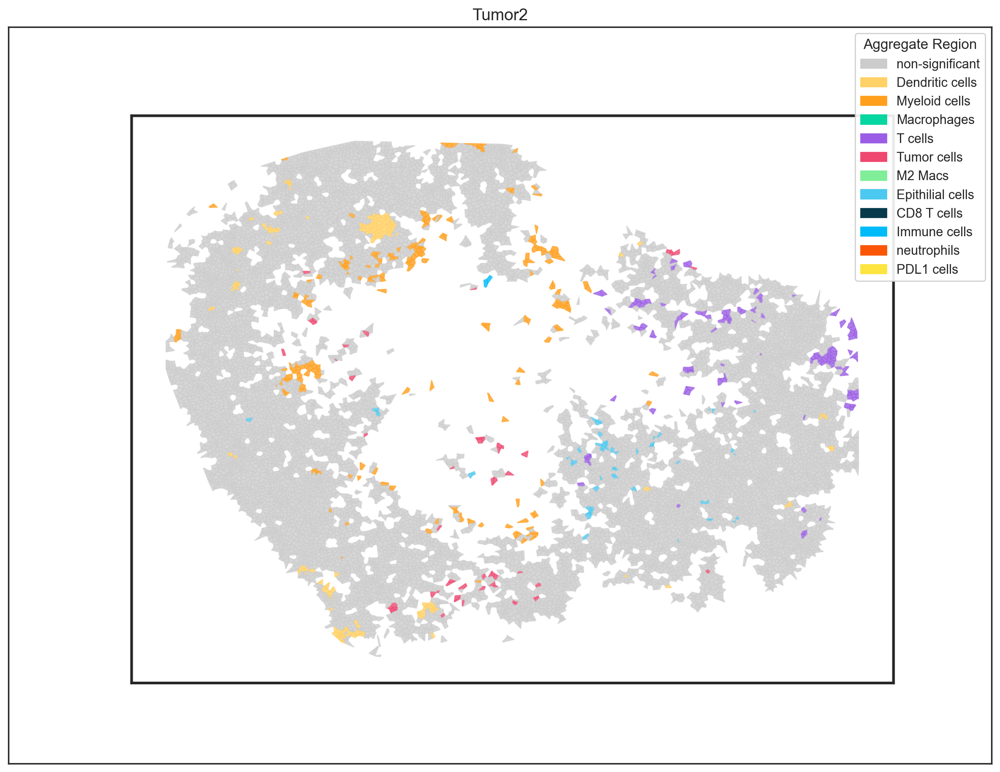

In [26]:
# Visualize aggregate regions on the same ROI(s) as before 
# same approach as the voronoi cell above but now we color by aggregate_label instead of phenotype
# so instead of seeing individual cell types you see which regions are
# dense clusters vs mixed -- one image per ROI in aggregate_rois

# ‼️Review the types of aggregate regions from the cell output above -- now assign them colors:‼️

agg_voronoi_colors = {
    'M1 Macs':          '#118ab2',
    'non-significant':  '#cccccc',
    'Dendritic cells':  '#ffd166',
    'Myeloid cells':    '#ff9f1c',
    'Macrophages':      '#06d6a0',
    'T cells':          '#9b5de5',
    'Lymphoid cells':   '#f15bb5',
    'Tumor cells':      '#ef476f',
    'M2 Macs':          '#80ed99',
    'Epithilial cells': '#4cc9f0',
    'CD8 T cells':      '#073b4c',
    'Immune cells':     '#00bbf9',
    'neutrophils':      '#fb5607',
    'CD4 T cells':      '#7209b7',
    'NK cells':         '#3a86ff',
    'PDL1 cells':       '#fee440',}

for roi in aggregate_rois:
    print(f'--- {roi} ---')

    # subset to this ROI
    adata_roi_agg = adata1[adata1.obs[roi_col] == roi].copy()

    # Downsample for speed, same as the phenotype voronoi above -- stratified by
    # aggregate_label this time since that's what's being visualized here
    if voronoi_max_cells is not None and adata_roi_agg.n_obs > voronoi_max_cells:
        frac = voronoi_max_cells / adata_roi_agg.n_obs
        sampled_idx = (adata_roi_agg.obs
                       .groupby(aggregate_label, group_keys=False)
                       .sample(frac=frac, random_state=0)  # fixed seed so the plot is reproducible across reruns
                       .index)
        adata_roi_agg = adata_roi_agg[sampled_idx].copy()
        print(f'Downsampled to {adata_roi_agg.n_obs:,} cells for faster Voronoi rendering (voronoi_max_cells={voronoi_max_cells:,})')

    # save the voronoi colored by aggregate regions
    agg_filename = f'voronoi_aggregate_{roi}.png'  # separate filename per ROI so plots don't overwrite each other

    sm.pl.voronoi(
        adata_roi_agg,
        color_by=aggregate_label,   # color by aggregate region, not phenotype
        voronoi_edge_color='facecolor',
        voronoi_line_width=0.3,
        voronoi_alpha=0.8,
        size_max=voronoi_size_max,
        overlay_points=None,
        plot_legend=False,
        legend_size=6,
        colors=agg_voronoi_colors, 
        saveDir=voronoi_save_dir,
        fileName=agg_filename
    )

    # build the actual path the same way as before
    agg_actual_path = os.path.join(voronoi_save_dir, agg_filename)

    # reload and add legend same as before
    img_agg = Image.open(agg_actual_path)

    fig, ax = plt.subplots(figsize=(12, 12), dpi=200)
    ax.imshow(img_agg)
    ax.set_xticks([])
    ax.set_yticks([])

    # build legend from the aggregate labels that actually exist in this ROI
    legend_patches = [
        mpatches.Patch(color=color, label=label)
        for label, color in agg_voronoi_colors.items()
        if label in adata_roi_agg.obs[aggregate_label].values  # mostly same as before
    ]

    ax.legend(handles=legend_patches, loc='upper right',
              fontsize=11, framealpha=0.9,
              title='Aggregate Region', title_fontsize=12)

    ax.set_title(roi, fontsize=14)  # label which ROI this is, since there's now more than one

    plt.tight_layout()
    # Overwrite the bare version scimap saved above with this one (image + our own legend)
    # -- save before show(), since Jupyter's inline backend closes the figure as part of
    # showing it, so saving after show() would silently save a blank figure instead
    plt.savefig(agg_actual_path, dpi=200, bbox_inches='tight')
    plt.show()

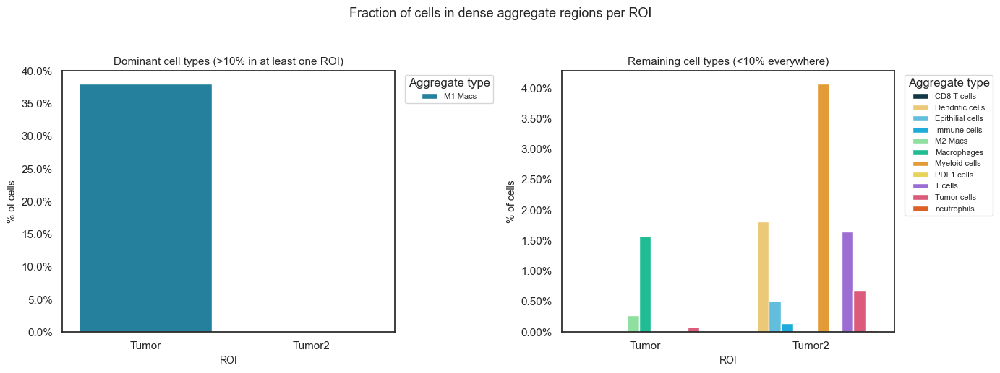

In [31]:
## Here we look at how much of each ROI is dense aggregate vs mixed
# counts what fraction of cells in each ROI fall into a pure aggregate vs the mixed other category
# useful for comparing ROIs

from matplotlib.ticker import PercentFormatter  # formats the y axis as a % without changing the underlying 0-1 data

agg_counts = (adata1.obs
              .groupby([roi_col, aggregate_label], observed=True) # observed=True -- without this, groupby on
                  # two categorical columns creates a phantom zero-count row for EVERY (ROI, aggregate_label)
                  # combination that doesn't actually occur, not just non-significant ones.
              .size() # count cells per group
              .reset_index(name='count')) # turn into a flat table

# reset_index() still carries over the FULL categorical dtype for roi_col (all 3 ROIs
# defined), even though Spleen has zero rows here -- seaborn reserves an axis slot for
# every defined category regardless of whether any rows actually have it, so drop the
# ones that don't occur in this table
agg_counts[roi_col] = agg_counts[roi_col].cat.remove_unused_categories()

# calculate fraction within each ROI so bars are comparable regardless of raw ROI size
# (denominator is still ALL cells in the ROI, non-significant included, so these fractions
# read as "% of the whole ROI" even after we drop the non-significant bars below)
agg_counts['fraction'] = (agg_counts
                          .groupby(roi_col, observed=True)['count'] # within each ROI
                          .transform(lambda x: x / x.sum())) # lambda func to divide each count by the ROI total

# Drop the non-significant ("mixed") rows so the chart focuses on pure aggregate regions --
# these are genuine "mixed" cells within Tumor/Tumor2 that didn't reach the purity threshold
agg_counts = agg_counts[agg_counts[aggregate_label] != 'non-significant']

# Explicit plot order so every ROI always shows up, even with a 0% bar, in both panels below
# -- relying on roi_col's categorical dtype to do this implicitly is fragile (script 05's
# equivalent roi_col is a plain string column and silently drops empty ROIs without this)
roi_order = sorted(agg_counts[roi_col].unique())

# Split off whichever cell type(s) hit a high fraction in at least one ROI
# into their own panel, so the rest can share one normal, easy-to-read linear % axis
DOMINANT_THRESHOLD = 0.10  # ‼️UPDATE‼️ raise/lower if a different split makes more sense for your data
max_fraction = agg_counts.groupby(aggregate_label)['fraction'].max()
dominant_types = max_fraction[max_fraction > DOMINANT_THRESHOLD].index.tolist()
other_types = [t for t in max_fraction.index if t not in dominant_types]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, types, subtitle in [
    (axes[0], dominant_types, f'Dominant cell types (>{DOMINANT_THRESHOLD:.0%} in at least one ROI)'),
    (axes[1], other_types, f'Remaining cell types (<{DOMINANT_THRESHOLD:.0%} everywhere)'),
]:
    if not types:  # possible if every type happens to land on one side of the threshold
        ax.axis('off')
        continue
    subset = agg_counts[agg_counts[aggregate_label].isin(types)]
    sns.barplot(
        data=subset,
        x=roi_col, # one group of bars per ROI
        y='fraction',   # height = fraction of cells in this aggregate type
        order=roi_order,  # show every ROI even if it's 0% for every type in this panel
        hue=aggregate_label,  # one bar color per aggregate label
        hue_order=types,
        palette=agg_voronoi_colors,  # reuse the same colors as the aggregate voronoi plot above,
                                      # so the same cell type reads as the same color across both
        ax=ax
    )
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1))  # xmax=1 means the data is already 0-1, not 0-100
    ax.set_title(subtitle, fontsize=11)
    ax.set_xlabel('ROI', fontsize=10)
    ax.set_ylabel('% of cells', fontsize=10)
    ax.tick_params(axis='x', rotation=0)
    ax.legend(title='Aggregate type', bbox_to_anchor=(1.02, 1),  # legend outside the plot so it doesn't cover the bars
              loc='upper left', fontsize=8)

fig.suptitle('Fraction of cells in dense aggregate regions per ROI', fontsize=13, y=1.03)
plt.tight_layout()
plt.show()